<font color='orange'>**Please create your own copy before starting modification**</font>

Dependencies: Add Your dependencies here

In [157]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Code

<font color='red'>**Part 1**</font>

<font color='cyan'>**Dataset: The dataset represents the mood of a student to go to class depending on the weather at IIT Jodhpur. We have been accustomed to online classes so this is to give you folks a feeling of attending classes in the post COVID scenario.**</font>

A sample of the dataset is shown

In [158]:
dic = {'Time':'Morning','Temperature':'Hot','Friend_Attending':'No','Windy':'Yes','Attend':'Yes'}
df= pd.DataFrame(dic,index=[0])
df

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,No,Yes,Yes


Read the complete data from the CSV file at link: "Add Link to CSV here"



In [159]:
df=pd.read_csv("Data_Decision_Trees - Sheet1.csv")
df.head()

,Time,Temperature,Friend_Attending,Windy,Attend
0,Morning,Hot,Yes,Low,No
1,Morning,Hot,Yes,High,No
2,Afternoon,Hot,Yes,Low,Yes
3,Evening,Warm,Yes,Low,Yes
4,Evening,Cool,No,Low,Yes


<font color='red'>**Part 2**</font>

Implement the same using Scikit Learn

Preprocessing

In [160]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
time =LabelEncoder()
tempertaure=LabelEncoder()
friend_attending=LabelEncoder()
windy=LabelEncoder()
attend=LabelEncoder()
df['time']=time.fit_transform(df['Time'])
df['temperature']=tempertaure.fit_transform(df["Temperature"])
df['friend_attending']=friend_attending.fit_transform(df['Friend_Attending'])
df['windy']=windy.fit_transform(df["Windy"])
df['attend']=attend.fit_transform(df["Attend"])
df1=df.drop(['Time','Temperature','Friend_Attending','Windy','Attend'],axis="columns")
df1





,time,temperature,friend_attending,windy,attend
0,2,1,1,1,0
1,2,1,1,0,0
2,0,1,1,1,1
3,1,2,1,1,1
4,1,0,0,1,1
5,1,0,0,0,0
6,0,0,0,0,1
7,2,2,1,1,0
8,2,0,0,1,1
9,1,2,0,1,1


Shuffle the data frame

In [161]:
x_train,x_test=train_test_split(df1,test_size=2,train_size=12, shuffle="false")


Take two for testing and rest for training

In [162]:
data=x_train
y_train=x_train["attend"]
x_train=x_train.drop("attend",axis=1)
y_test=x_test["attend"]
x_test=x_test.drop("attend",axis=1)
x_test

,time,temperature,friend_attending,windy
1,2,1,1,0
13,1,2,1,0


Display Training

In [163]:
print(x_train)


    time  temperature  friend_attending  windy
6      0            0                 0      0
12     0            1                 0      1
7      2            2                 1      1
0      2            1                 1      1
5      1            0                 0      0
2      0            1                 1      1
3      1            2                 1      1
10     2            2                 0      0
11     0            2                 1      0
9      1            2                 0      1
4      1            0                 0      1
8      2            0                 0      1


Display Testing

In [164]:
print(x_test)


    time  temperature  friend_attending  windy
1      2            1                 1      0
13     1            2                 1      0


Given the follwing data construct a decision tree using Entropy

In [165]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
gainT=DecisionTreeClassifier(criterion='entropy')
gainT.fit(x_train,y_train)
gainT.score(x_train,y_train)
gainT.predict(x_test)
t1=tree.export_text(gainT)
print(t1)



|--- feature_0 <= 0.50
|   |--- class: 1
|--- feature_0 >  0.50
|   |--- feature_2 <= 0.50
|   |   |--- feature_3 <= 0.50
|   |   |   |--- feature_1 <= 1.00
|   |   |   |   |--- class: 0
|   |   |   |--- feature_1 >  1.00
|   |   |   |   |--- class: 1
|   |   |--- feature_3 >  0.50
|   |   |   |--- class: 1
|   |--- feature_2 >  0.50
|   |   |--- feature_0 <= 1.50
|   |   |   |--- class: 1
|   |   |--- feature_0 >  1.50
|   |   |   |--- class: 0



Fit the classifier using Gini Impurity

In [166]:
giniT=DecisionTreeClassifier(criterion='gini')
giniT.fit(x_train,y_train)
gainT.score(x_train,y_train)
gainT.predict(x_test)
t2=tree.export_text(giniT)
print(t2)

|--- feature_0 <= 0.50
|   |--- class: 1
|--- feature_0 >  0.50
|   |--- feature_2 <= 0.50
|   |   |--- feature_3 <= 0.50
|   |   |   |--- feature_0 <= 1.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_0 >  1.50
|   |   |   |   |--- class: 1
|   |   |--- feature_3 >  0.50
|   |   |   |--- class: 1
|   |--- feature_2 >  0.50
|   |   |--- feature_0 <= 1.50
|   |   |   |--- class: 1
|   |   |--- feature_0 >  1.50
|   |   |   |--- class: 0



Print the cross validation score with folds = 5

In [167]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(gainT,df1.iloc[:,:-1],df1.iloc[:,-1],cv=5)
print(score)
print(score.mean())

[0.66666667 1.         0.66666667 0.66666667 0.5       ]
0.7


Print the depth of the decison Tree

In [168]:
print("Depth of entropy tree =",gainT.get_depth())
print("Depth of gini tree =",giniT.get_depth())

Depth of entropy tree = 4
Depth of gini tree = 4


Print the number of leaves in the decision Tree

In [169]:
print("no of leaves in entropy tree =",gainT.get_n_leaves())
print("No of leaves in gini tree =",giniT.get_n_leaves())

no of leaves in entropy tree = 6
No of leaves in gini tree = 6


Return the index of the leaf that each sample is predicted as.



In [170]:
print(gainT.apply(x_test))
print(giniT.apply(x_test))

[10  9]
[10  9]


Print the decision path

In [171]:
print(gainT.decision_path(x_test))
print("\n")
print(giniT.decision_path(x_test))

  (0, 0)	1
  (0, 2)	1
  (0, 8)	1
  (0, 10)	1
  (1, 0)	1
  (1, 2)	1
  (1, 8)	1
  (1, 9)	1


  (0, 0)	1
  (0, 2)	1
  (0, 8)	1
  (0, 10)	1
  (1, 0)	1
  (1, 2)	1
  (1, 8)	1
  (1, 9)	1


Print the gini impurity of each feature

In [172]:
print(f"gini impurity based on entropy model : {', '.join(map(str,gainT.feature_importances_))}")
print(f"gini impurity based on gini model : {', '.join(map(str,giniT.feature_importances_))}")

gini impurity based on entropy model : 0.4986733100429168, 0.2054371511345519, 0.13054956211294774, 0.16533997670958353
gini impurity based on gini model : 0.6851851851851851, 0.0, 0.18148148148148158, 0.13333333333333325


Training Accuracy

In [173]:

from sklearn.metrics import accuracy_score
print(accuracy_score(y_train,gainT.predict(x_train)))
print(accuracy_score(y_train,giniT.predict(x_train)))

1.0
1.0


Testing accuracy

In [174]:
print(accuracy_score(y_test,gainT.predict(x_test)))
print(accuracy_score(y_test,giniT.predict(x_test)))

0.5
0.5


Map the query: [Time: Morning, Temperature: Warm, Friend_Attending: No, 'Wind': Low] to the correct numerical value as the training and the predict the output.

In [175]:
print(gainT.predict([[2,2,0,1]]))

[1]


<font color='red'>**Part 3**</font>

Plot the decision tree

[Text(148.8, 195.696, 'X[0] <= 0.5\nentropy = 0.811\nsamples = 12\nvalue = [3, 9]'), Text(111.60000000000001, 152.208, 'entropy = 0.0\nsamples = 4\nvalue = [0, 4]'), Text(186.0, 152.208, 'X[2] <= 0.5\nentropy = 0.954\nsamples = 8\nvalue = [3, 5]'), Text(111.60000000000001, 108.72, 'X[3] <= 0.5\nentropy = 0.722\nsamples = 5\nvalue = [1, 4]'), Text(74.4, 65.232, 'X[1] <= 1.0\nentropy = 1.0\nsamples = 2\nvalue = [1, 1]'), Text(37.2, 21.744, 'entropy = 0.0\nsamples = 1\nvalue = [1, 0]'), Text(111.60000000000001, 21.744, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'), Text(148.8, 65.232, 'entropy = 0.0\nsamples = 3\nvalue = [0, 3]'), Text(260.40000000000003, 108.72, 'X[0] <= 1.5\nentropy = 0.918\nsamples = 3\nvalue = [2, 1]'), Text(223.20000000000002, 65.232, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]'), Text(297.6, 65.232, 'entropy = 0.0\nsamples = 2\nvalue = [2, 0]')]


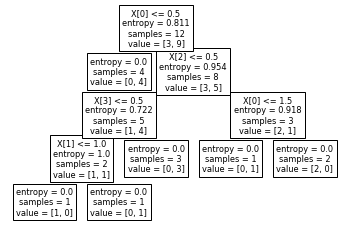

In [176]:
from sklearn.tree import plot_tree
print(plot_tree(gainT))

[Text(148.8, 195.696, 'X[0] <= 0.5\ngini = 0.375\nsamples = 12\nvalue = [3, 9]'), Text(111.60000000000001, 152.208, 'gini = 0.0\nsamples = 4\nvalue = [0, 4]'), Text(186.0, 152.208, 'X[2] <= 0.5\ngini = 0.469\nsamples = 8\nvalue = [3, 5]'), Text(111.60000000000001, 108.72, 'X[3] <= 0.5\ngini = 0.32\nsamples = 5\nvalue = [1, 4]'), Text(74.4, 65.232, 'X[0] <= 1.5\ngini = 0.5\nsamples = 2\nvalue = [1, 1]'), Text(37.2, 21.744, 'gini = 0.0\nsamples = 1\nvalue = [1, 0]'), Text(111.60000000000001, 21.744, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'), Text(148.8, 65.232, 'gini = 0.0\nsamples = 3\nvalue = [0, 3]'), Text(260.40000000000003, 108.72, 'X[0] <= 1.5\ngini = 0.444\nsamples = 3\nvalue = [2, 1]'), Text(223.20000000000002, 65.232, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'), Text(297.6, 65.232, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]')]


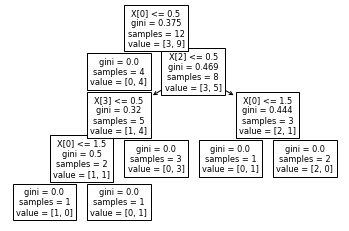

In [177]:
print(plot_tree(giniT))

Plot the decision surface

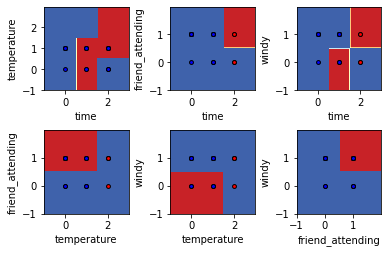

In [178]:
n_classes = 3
plot_colors = "ryb"
plot_step = 0.02


for pairidx, pair in enumerate([[0, 1], [0, 2], [0, 3],
                                [1, 2], [1, 3], [2, 3]]):
    # We only take the two corresponding features
    X = data.iloc[:, pair]
    y = data.iloc[:,-1]

    # Train
    clf = DecisionTreeClassifier().fit(X, y)

    # Plot the decision boundary
    plt.subplot(2, 3, pairidx + 1)

    x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
    y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=plt.cm.RdYlBu)

    plt.xlabel(data.keys()[pair[0]])
    plt.ylabel(data.keys()[pair[1]])

    plt.scatter(X.iloc[:, 0], y, c=plot_colors[0],cmap=plt.cm.RdYlBu, edgecolor='black', s=15)
    plt.scatter(X.iloc[:, 1], y, c=plot_colors[2],cmap=plt.cm.RdYlBu, edgecolor='black', s=15)

<font color='magenta'>**Part 04: Not Compulsory**</font>

Advanced: Can you implement the partitioning of the decision tree using the following algorithm

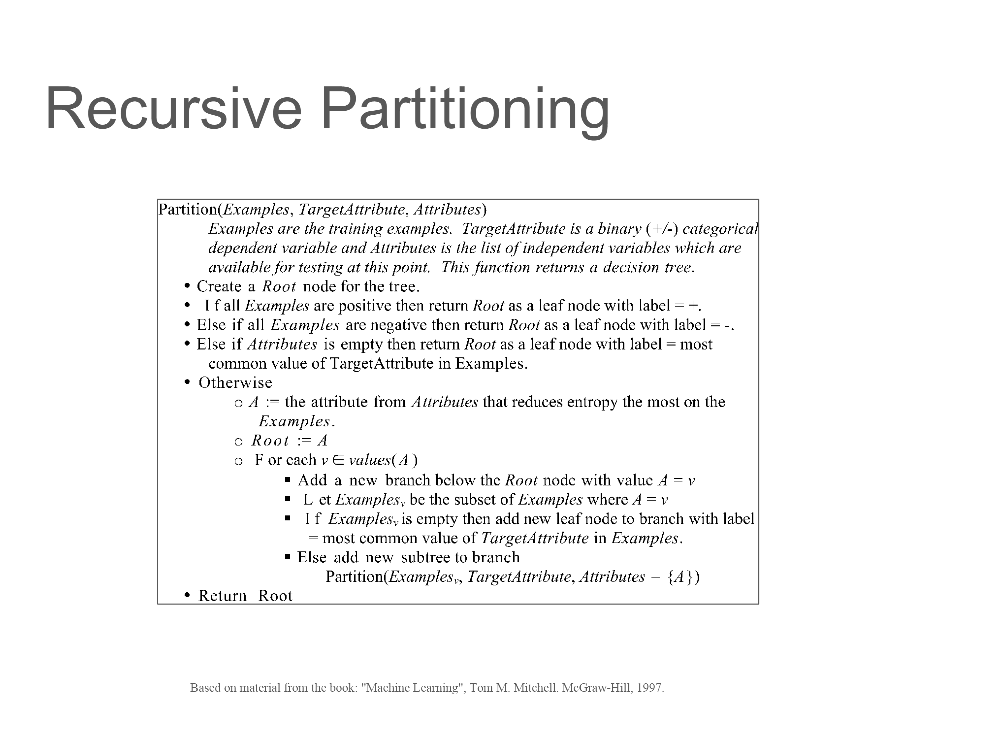

Part 5: Building Decision Trees when the data is of a continuous nature

In the previous case the nodes were broken based on entropy/gini impurity. In the case of regression the mean sqaured error is the decsion parameter for splitting the nodes. The following dataset contains continuous data and we need to use decision trees with regression.

Read the dataset

In [179]:
df2=pd.read_csv('death.csv')
df2

,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent Trend (2),Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,No,46,45.9,46.1,"1,57,376",falling,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,No,125.6,108.9,144.2,43,stable,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,No,125.3,100.2,155.1,18,stable,1.7,0,3.4
3,"North Slope Borough, Alaska",2185,No,124.9,73,194.7,5,**,**,**,**
4,"Owsley County, Kentucky",21189,No,118.5,83.1,165.5,8,stable,2.2,-0.4,4.8
...,...,...,...,...,...,...,...,...,...,...,...
3136,"Yakutat City and Borough, Alaska<sup>3</sup>",2282,*,*,*,*,*,**,**,**,**
3137,"Yukon-Koyukuk Census Area, Alaska",2290,*,*,*,*,*,**,**,**,**
3138,"Zapata County, Texas",48505,*,*,*,*,*,*,*,*,*
3139,"Zavala County, Texas",48507,*,*,*,*,*,**,**,**,**


Preprocess the dataset to remove all the rows with empty column values

In [180]:
for i in range(len(df2)):
    for j in df2.keys():
        if df2.loc[i][j]=='*' or df2.loc[i][j]=='**':
            df2=df2.drop(i,axis='index')
            break
df2=df2.reset_index(drop=True)
df2


,County,FIPS,Met Objective of 45.5? (1),Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,Recent Trend (2),Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,No,46,45.9,46.1,"1,57,376",falling,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,No,125.6,108.9,144.2,43,stable,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,No,125.3,100.2,155.1,18,stable,1.7,0,3.4
3,"Owsley County, Kentucky",21189,No,118.5,83.1,165.5,8,stable,2.2,-0.4,4.8
4,"Union County, Florida",12125,No,113.5,89.9,141.4,19,falling,-2.2,-4.3,0
...,...,...,...,...,...,...,...,...,...,...,...
2689,"Los Alamos County, New Mexico",35028,Yes,15.8,9.4,25.4,4,stable,-2.9,-5.8,0
2690,"Eagle County, Colorado",8037,Yes,14.9,8.7,23.6,5,falling,-4.9,-9.3,-0.3
2691,"Utah County, Utah",49049,Yes,12.4,10.7,14.4,37,falling,-2.8,-3.9,-1.8
2692,"McKinley County, New Mexico",35031,Yes,11.6,8,16.2,7,falling,-3.2,-5.7,-0.7


Convert Categorical Values to numerical

In [181]:
for i in range(len(df2.iloc[:,6])):
    df2.iloc[i,6]=int(str(df2.iloc[i,6]).replace(',',''))
metObject=LabelEncoder()
recentTrend=LabelEncoder()
df2.insert(2,'metObject',metObject.fit_transform(df2['Met Objective of 45.5? (1)']))
df2.insert(8,'recentTrend',recentTrend.fit_transform(df2['Recent Trend (2)']))
df2=df2.drop(['Met Objective of 45.5? (1)','Recent Trend (2)'],axis=1)
df2

,County,FIPS,metObject,Age-Adjusted Death Rate,Lower 95% Confidence Interval for Death Rate,Upper 95% Confidence Interval for Death Rate,Average Deaths per Year,recentTrend,Recent 5-Year Trend (2) in Death Rates,Lower 95% Confidence Interval for Trend,Upper 95% Confidence Interval for Trend
0,United States,0,0,46,45.9,46.1,157376,0,-2.4,-2.6,-2.2
1,"Perry County, Kentucky",21193,0,125.6,108.9,144.2,43,2,-0.6,-2.7,1.6
2,"Powell County, Kentucky",21197,0,125.3,100.2,155.1,18,2,1.7,0,3.4
3,"Owsley County, Kentucky",21189,0,118.5,83.1,165.5,8,2,2.2,-0.4,4.8
4,"Union County, Florida",12125,0,113.5,89.9,141.4,19,0,-2.2,-4.3,0
...,...,...,...,...,...,...,...,...,...,...,...
2689,"Los Alamos County, New Mexico",35028,1,15.8,9.4,25.4,4,2,-2.9,-5.8,0
2690,"Eagle County, Colorado",8037,1,14.9,8.7,23.6,5,0,-4.9,-9.3,-0.3
2691,"Utah County, Utah",49049,1,12.4,10.7,14.4,37,0,-2.8,-3.9,-1.8
2692,"McKinley County, New Mexico",35031,1,11.6,8,16.2,7,0,-3.2,-5.7,-0.7


Split the dataset into train and test(Based on split size)

In [182]:
x_train,x_test=train_test_split(df2, shuffle="false")
y_train=x_train.iloc[:,-1]
x_train=x_train.iloc[:,1:-1]
x_train
y_test=x_test.iloc[:,-1]
x_test=x_test.iloc[:,1:-1]
# x_train=x_train.iloc[:,1:-1]
# y_test=y_train.iloc[:,-1]
# y_train=y_train.iloc[:,1:-1]

Perform the decision tree regression

In [191]:
from sklearn.tree import DecisionTreeRegressor
m=DecisionTreeRegressor()
m.fit(x_train,y_train)
scores = cross_val_score(m,df2.iloc[:,1:-1],df2.iloc[:,-1],cv=5)
print(scores.mean())

0.5500161805170748


Predict on test dataset

In [184]:
m.predict(x_test)
print("Training score =",m.score(x_train,y_train))
print("Testing score =",m.score(x_test,y_test))

Training score = 1.0
Testing score = 0.5188084320844968


Calculate Squared Error between predicted and real values

In [185]:
from sklearn.metrics import mean_squared_error
print(mean_squared_error(y_true=y_train,y_pred=m.predict(x_train)))
print(mean_squared_error(y_true=y_test,y_pred=m.predict(x_test)))

1.1806331931359972e-33
3.77893175074184


In [187]:
from sklearn.tree import export_text
print(export_text(m))

|--- feature_7 <= 15.50
|   |--- feature_7 <= 3.85
|   |   |--- feature_6 <= 0.50
|   |   |   |--- feature_7 <= -2.65
|   |   |   |   |--- feature_7 <= -13.80
|   |   |   |   |   |--- feature_5 <= 29.50
|   |   |   |   |   |   |--- feature_3 <= 18.35
|   |   |   |   |   |   |   |--- value: [-10.30]
|   |   |   |   |   |   |--- feature_3 >  18.35
|   |   |   |   |   |   |   |--- feature_8 <= -36.70
|   |   |   |   |   |   |   |   |--- value: [-6.50]
|   |   |   |   |   |   |   |--- feature_8 >  -36.70
|   |   |   |   |   |   |   |   |--- value: [-8.10]
|   |   |   |   |   |--- feature_5 >  29.50
|   |   |   |   |   |   |--- feature_8 <= -23.40
|   |   |   |   |   |   |   |--- value: [-4.60]
|   |   |   |   |   |   |--- feature_8 >  -23.40
|   |   |   |   |   |   |   |--- value: [-4.80]
|   |   |   |   |--- feature_7 >  -13.80
|   |   |   |   |   |--- feature_5 <= 119.50
|   |   |   |   |   |   |--- feature_4 <= 63.15
|   |   |   |   |   |   |   |--- feature_7 <= -5.30
|   |   |   |   | 

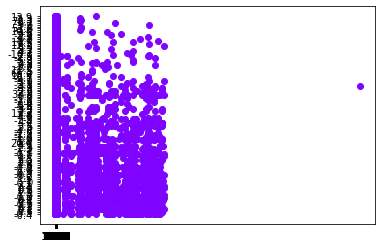

In [194]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
for i in x_train.keys():
  plt.scatter(x_train.loc[:,i],y_train,color=c)

[Text(286.02710431660125, 212.91, 'X[7] <= 15.5\nmse = 10.05\nsamples = 2020\nvalue = 0.803'), Text(237.6593209375207, 203.85, 'X[7] <= 3.85\nmse = 5.039\nsamples = 2018\nvalue = 0.733'), Text(141.53142263583695, 194.79, 'X[6] <= 0.5\nmse = 2.593\nsamples = 2010\nvalue = 0.649'), Text(42.47636138262876, 185.73, 'X[7] <= -2.65\nmse = 0.888\nsamples = 669\nvalue = -0.952'), Text(11.32494611661499, 176.67, 'X[7] <= -13.8\nmse = 1.593\nsamples = 169\nvalue = -1.907'), Text(3.7726083339635488, 167.60999999999999, 'X[5] <= 29.5\nmse = 4.57\nsamples = 5\nvalue = -6.86'), Text(3.367496029645315, 158.55, 'X[3] <= 18.35\nmse = 2.427\nsamples = 3\nvalue = -8.3'), Text(3.1649398774861988, 149.49, 'mse = 0.0\nsamples = 1\nvalue = -10.3'), Text(3.570052181804432, 149.49, 'X[8] <= -36.7\nmse = 0.64\nsamples = 2\nvalue = -7.3'), Text(3.367496029645315, 140.43, 'mse = 0.0\nsamples = 1\nvalue = -6.5'), Text(3.7726083339635488, 140.43, 'mse = 0.0\nsamples = 1\nvalue = -8.1'), Text(4.177720638281782, 158.

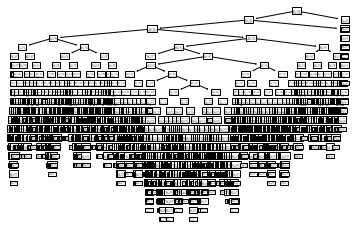

In [188]:
print(plot_tree(m))



<font color='green'>**References**</font>



*   [Ref1](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)

*   [Ref2](https://pbpython.com/categorical-encoding.html)


*   [Ref3](https://mljar.com/blog/visualize-decision-tree/)


*   [Ref4](https://scikit-learn.org/stable/auto_examples/tree/plot_iris_dtc.html#sphx-glr-auto-examples-tree-plot-iris-dtc-py)


*   [Ref5](https://scikit-learn.org/stable/auto_examples/tree/plot_tree_regression.html)

*   [Ref6](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html)